In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
import os
from sklearn.preprocessing import StandardScaler
# from tf.keras.models import Sequential  # This does not work!
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Input, Dense, GRU, Embedding, LSTM, Dropout
from tensorflow.python.keras.optimizers import RMSprop
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau

In [3]:
import pyodbc
import pandas as pd

driver = "{SQL Server}"
conn = pyodbc.connect("""DRIVER={driver};SERVER=mss3107;DATABASE=AdvancedAnalytics""".format(driver=driver), autocommit=False)
#cursor = conn.cursor()
Speedway_Full_query = """ 
select T1.*, T3.FuelMarket ,  T2.State ,T2.City
from SPEEDWAY_PRICE_RESTORATION_HOURLY_COMP_WEST_JOINED_FULL T1 left Join 
[AdvancedAnalytics].[dbo].[SPEEDWAY_ANALYTICS_STORES] T2 ON
T1.StoreNumber = T2.StoreNumber left Join 
SPEEDWAY_PRICE_RESTORATION_FUEL_MARKETS  T3 ON 
T1.StoreNumber=T3.StoreNumber
    """
Speedway_Full_df=pd.read_sql_query(Speedway_Full_query , conn)
Speedway_Full_df.to_pickle('Speedway_Full_df')
conn.close()

In [3]:
#Speedway_Full_df.to_pickle('Speedway_Full_df')
def norm_df(df):
    df= pd.DataFrame(df)
    scaler = StandardScaler()
    df[df.columns]=scaler.fit_transform(df.values.reshape(-1, 1))
    return df[df.columns[0]]
Speedway_Full_df = pd.read_pickle('Speedway_Full_df')
Speedway_Full_df=Speedway_Full_df[['StoreNumber','DateTime','Price', 'Cost', 'Margin',
                                   'Gallons', 'Primary','Secondary','Feul_Margin', 
                                   'Inside_Margin','FuelMarket','State','City']]
Speedway_Full_df['Hour']=Speedway_Full_df.set_index('DateTime').index.hour
Speedway_Full_df['Weekday']=Speedway_Full_df.set_index('DateTime').index.dayofweek+1
#Speedway_Full_df['City']=Speedway_Full_df['FuelMarket'].apply(lambda x: x.split('-')[1])
#Speedway_Full_df['State']=Speedway_Full_df['FuelMarket'].apply(lambda x: x.split('-')[0])
Speedway_Full_df=Speedway_Full_df[['StoreNumber','DateTime','Weekday','Hour',
                                   'State','City','FuelMarket','Price', 'Cost', 'Margin','Gallons', 
                                   'Primary','Secondary','Feul_Margin', 'Inside_Margin']]
Speedway_Full_df['Gallons']=Speedway_Full_df.groupby(['StoreNumber'])['Gallons']\
.transform(norm_df)
Speedway_Full_df['Feul_Margin']=Speedway_Full_df.groupby(['StoreNumber'])['Feul_Margin']\
.transform(norm_df)
Speedway_Full_df['Inside_Margin']=Speedway_Full_df.groupby(['StoreNumber'])['Inside_Margin']\
.transform(norm_df)

c:\users\md38\appdata\local\programs\python\python37\lib\site-packages\sklearn\utils\extmath.py:747: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
c:\users\md38\appdata\local\programs\python\python37\lib\site-packages\sklearn\utils\extmath.py:688: RuntimeWarning: Degrees of freedom <= 0 for slice.
  result = op(x, *args, **kwargs)


In [5]:
def group_agg(df,agg_cols,cols):
    Gallons_avg=df.groupby(agg_cols).mean()[cols].copy()    
    columns={}
    for col in cols:
        Gallons_avg[col]=norm_df(Gallons_avg[col])
        columns[col]=col+'_'+agg_cols[0]
    Gallons_avg=Gallons_avg.reset_index().rename(columns=columns)
    return pd.merge(df, Gallons_avg, on=agg_cols, how='left')

def norm_df(df):
    df= pd.DataFrame(df)
    scaler = StandardScaler()
    df[df.columns]=scaler.fit_transform(df.values.reshape(-1, 1))
    return df[df.columns[0]]

rack_df=pd.read_csv('\\\\mgroupnet.com\RedirectedFolders\md38\Desktop\Test\Genescape\Genscape_Hourly_PADD2_Agg.csv')#.dropna()
missing_racks={'MI-Outstate':[['Flint/Owosso','Owosso']],
 'OH-Akron/Canton':[['Canton/Akron','Akron']],
  'OH-Unassigned':[['Marietta','Null']],
   'KY-Lexington/Outstate':[['Ashland','Null'],['Lexington','Nicholasville'],['Paducah','Null']],
   'IN-Outstate':[['Evansville','Null'],['Princeton','Null'],['Switz City','Null'],['Huntington','Null']],
   'IL-Outstate':[['Rockford','Null'],['Amboy','Null']],
   'WI-Unassigned':[['Waupun','Null'],['Chippewa Falls','Null'],['Junction City','Null']],
   'MN-Unassigned':[['Alexandria','Null'],['Minneapolis/Saint Paul','Null'],
                    ['Marshall','Null'],['Mankato','Null'],['Rochester','Null']],
   'TN-Nashville':[['Memphis','Null']]}
rack_df=rack_df[['Period', 'RackId', 'RackName','State', 'City','FuelMarket','SumNetVolume', 'AvgPrice']]
rack_df=rack_df[rack_df['State'].isin(['OH','KY','IN','IL','WI','MN','TN'])]
#rack_df[['RackName','FuelMarket','State','City']].drop_duplicates()
for k in missing_racks:
    for v in missing_racks[k]:
        rack_df.loc[rack_df['RackName']==v[0],['FuelMarket','City']]=[k,v[1]]
rack_df=rack_df[~rack_df['FuelMarket'].isnull()]
rack_df['Period']=pd.to_datetime(rack_df['Period'])
rack_df['Period'] = rack_df['Period'].astype(str).str[:-6]
rack_df['Period']=pd.to_datetime(rack_df['Period'])
rack_df['Period']=rack_df.groupby(["RackId"]).Period.shift(2, axis = 0)
rack_df=rack_df[~rack_df['Period'].isnull()]
#rack_df=rack_df.dropna().sort_values(['RackId','Period']).reset_index(drop=True)
rack_df=rack_df.sort_values(['RackId','Period']).reset_index(drop=True)

#rack_df=rack_df.groupby(['Period'], as_index=False).mean().sort_values(['Period'])
#rack_df['Hour']=rack_df.set_index('Period').index.hour
#rack_df['Weekday']=rack_df.set_index('Period').index.dayofweek+1
rack_df=rack_df.rename(columns={"Period": "DateTime" , "SumNetVolume" : "RackVolume", "AvgPrice" : "RackPrice"})

zero_ls=list(rack_df.groupby('City').mean().reset_index()[['City','RackVolume']][rack_df.groupby('City').mean()\
            .reset_index()[['City','RackVolume']]['RackVolume']==0]['City'])
zero_id_ls=list(rack_df.groupby('RackId').mean().reset_index()[['RackId','RackVolume']][rack_df.groupby('RackId').mean()\
            .reset_index()[['RackId','RackVolume']]['RackVolume']==0]['RackId'])

rack_df=rack_df[~(rack_df['City'].isin(zero_ls))]
rack_df=rack_df[~(rack_df['RackId'].isin(zero_id_ls))]
                
#rack_df['RackVolume']=rack_df.groupby(['RackId'])['RackVolume'].transform(norm_df)
rack_df['RackVolume']=rack_df.groupby(['RackId'])['RackVolume'].apply(norm_df)
rack_df=group_agg(rack_df,['DateTime'],['RackVolume','RackPrice'])
rack_df=group_agg(rack_df,['State','DateTime'],['RackVolume','RackPrice'])
rack_df=group_agg(rack_df,['FuelMarket','DateTime'],['RackVolume','RackPrice'])
rack_df=group_agg(rack_df,['City','State','DateTime'],['RackVolume','RackPrice'])

#rack_df=rack_df[~(rack_df['City']=='Unassigned')]
#rack_df=rack_df[['DateTime', 'RackId', 'RackName', 'State', 'RackVolume', 'AvgPrice',
#       'FuelMarket', 'City', 'Hour', 'Weekday', 'RackVolume_West',
#       'RackVolume_State', 'RackVolume_FuelMarket', 'RackVolume_City']]
#rack_df=rack_df.dropna().sort_values(['RackId','DateTime']).reset_index(drop=True)

#rack_df=rack_df.groupby(['State','City','FuelMarket','DateTime']).mean().reset_index()\
#.sort_values(['RackId','DateTime']).reset_index(drop=True)
rack_df=rack_df[~(rack_df['City']=='Null')]
rack_df=rack_df.sort_values(['RackId','DateTime']).reset_index(drop=True)

In [61]:
rack_df.head()

,DateTime,RackId,RackName,State,City,FuelMarket,RackVolume,RackPrice,RackVolume_DateTime,RackPrice_DateTime,RackVolume_State,RackPrice_State,RackVolume_FuelMarket,RackPrice_FuelMarket,RackVolume_City,RackPrice_City
0,2019-02-01 00:00:00,750,Chicago,IL,Chicago,IL-Chicago,-0.801430,1.47761,-0.801430,-2.650832,-0.801430,-2.403549,-0.801430,-2.297826,-0.801430,-2.266796
1,2019-02-01 01:00:00,750,Chicago,IL,Chicago,IL-Chicago,-1.400764,1.47761,-1.400764,-2.650832,-1.400764,-2.403549,-1.400764,-2.297826,-1.400764,-2.266796
2,2019-02-01 02:00:00,750,Chicago,IL,Chicago,IL-Chicago,-1.859712,1.47761,-1.859712,-2.650832,-1.859712,-2.403549,-1.859712,-2.297826,-1.859712,-2.266796
3,2019-02-01 03:00:00,750,Chicago,IL,Chicago,IL-Chicago,-1.606906,1.47761,-1.606906,-2.651253,-1.606906,-2.403549,-1.606906,-2.297826,-1.606906,-2.266796
4,2019-02-01 04:00:00,750,Chicago,IL,Chicago,IL-Chicago,-1.640067,1.47761,-1.640067,-2.651590,-1.640067,-2.403549,-1.640067,-2.297826,-1.640067,-2.266796


In [39]:
len(Speedway_Full_df[Speedway_Full_df['RackVolume_DateTime'].isnull()])

1135620

In [6]:
Speedway_Full_df=pd.merge(Speedway_Full_df, rack_df[['DateTime','RackVolume_DateTime','RackPrice_DateTime']].drop_duplicates()
                          , on=['DateTime',], how='left')
Speedway_Full_df=pd.merge(Speedway_Full_df, rack_df[['DateTime','FuelMarket','RackVolume_FuelMarket','RackPrice_FuelMarket']].drop_duplicates()
                          , on=['DateTime','FuelMarket',], how='left')
Speedway_Full_df=pd.merge(Speedway_Full_df, rack_df[['DateTime','State','RackVolume_State','RackPrice_State']].drop_duplicates()
                          , on=['DateTime','State',], how='left')
Speedway_Full_df=pd.merge(Speedway_Full_df, rack_df[['DateTime','State','City','RackVolume_City','RackPrice_City']].drop_duplicates()
                          , on=['DateTime','State','City',], how='left')\
.sort_values(['StoreNumber','DateTime']).reset_index(drop=True)
Speedway_Full_df['Price_diff']=Speedway_Full_df['Price']-Speedway_Full_df[['Primary','Secondary']].mean(axis=1)
del rack_df

In [7]:
def norm_df(df):
    df= pd.DataFrame(df)
    scaler = StandardScaler()
    df[df.columns]=scaler.fit_transform(df.values.reshape(-1, 1))
    return df[df.columns[0]]

def group_diff(df,agg_cols,cols):
    Gallons_avg=df.groupby(agg_cols+['Weekday','Hour']).mean()[cols].copy()
    columns={}
    
    for col in cols:
        #Gallons_avg[col]=norm_df(Gallons_avg[col])
        if agg_cols ==[]:
            columns[col]=col+'_'+'DateTime'
        else:
            columns[col]=col+'_'+agg_cols[0]
    Gallons_avg=Gallons_avg.reset_index().rename(columns=columns)
    df=pd.merge(df, Gallons_avg, on=agg_cols+['Weekday','Hour'], how='left')
    for col in cols:
        if agg_cols ==[]:
            df.loc[:,col+'_'+'DateTime'+'_diff']=df[col]-df[col+'_'+'DateTime']
            #df[col+'_'+'DateTime'+'_diff']=norm_df(df[col+'_'+'DateTime'+'_diff'])
            del df[col+'_'+'DateTime']
        else:
            df.loc[:,col+'_'+agg_cols[0]+'_diff']=df[col]-df[col+'_'+agg_cols[0]]
            #df[col+'_'+agg_cols[0]+'_diff']=norm_df(df[col+'_'+agg_cols[0]+'_diff'])
            del df[col+'_'+agg_cols[0]]
    return df

Speedway_Full_df=group_diff(Speedway_Full_df,[],['Gallons','RackVolume_DateTime'])
Speedway_Full_df=group_diff(Speedway_Full_df,['StoreNumber'],['Gallons','RackVolume_City'])
Speedway_Full_df=group_diff(Speedway_Full_df,['State'],['Gallons','RackVolume_State'])
Speedway_Full_df=group_diff(Speedway_Full_df,['FuelMarket'],['Gallons','RackVolume_FuelMarket'])
Speedway_Full_df=group_diff(Speedway_Full_df,['City','State'],['Gallons','RackVolume_City'])
Speedway_Full_df=Speedway_Full_df.sort_values(['StoreNumber','DateTime']).reset_index(drop=True)
Speedway_Full_df.to_pickle('Speedway_Full_df_final')

In [14]:
Speedway_Full_df = pd.read_pickle('Speedway_Full_df_final')
#Speedway_Full_df.to_csv('Speedway_Full_final.csv')

In [12]:
def fft_col(df,num_):
    close_fft = np.fft.fft(np.asarray(df.tolist()))
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    return np.real(np.fft.ifft(fft_list_m10))
#col_ls=['Gallons','Total_Margin','RackVolume_diff','Gallons_diff','Inside_Margin','Feul_Margin']
col_ls=['RackVolume_City_StoreNumber_diff','Gallons_StoreNumber_diff']
for col_ in col_ls:
    for num_ in [15]:
        col_name=col_+'_FFT'+str(num_).zfill(2)
        Speedway_Full_df[col_name]=Speedway_Full_df[~Speedway_Full_df[col_].isnull()].groupby(['StoreNumber'])[col_].transform(fft_col, num_=num_)


In [8]:
Speedway_Full_df.dropna().head()

,StoreNumber,DateTime,Weekday,Hour,State,City,FuelMarket,Price,Cost,Margin,...,Gallons_DateTime_diff,RackVolume_DateTime_DateTime_diff,Gallons_StoreNumber_diff,RackVolume_City_StoreNumber_diff,Gallons_State_diff,RackVolume_State_State_diff,Gallons_FuelMarket_diff,RackVolume_FuelMarket_FuelMarket_diff,Gallons_City_diff,RackVolume_City_City_diff
24981,1018,2019-02-04 11:00:00,1,11,IN,Indianapolis,IN-Indianapolis,2.259,2.0204,0.2386,...,-0.412005,-0.584277,-0.452412,-1.716479,-0.422174,-0.573084,-0.382677,-1.833561,-0.388883,-1.717109
24982,1018,2019-02-04 12:00:00,1,12,IN,Indianapolis,IN-Indianapolis,2.259,2.0204,0.2386,...,-1.110946,-0.722785,-0.910371,-0.260689,-1.108160,-0.248271,-1.049168,-0.264767,-1.049568,-0.248727
24983,1018,2019-02-04 13:00:00,1,13,IN,Indianapolis,IN-Indianapolis,2.259,2.0204,0.2386,...,-0.380351,-0.647539,-0.406055,-1.181383,-0.386199,-0.294932,-0.320046,-1.254524,-0.353005,-1.176010
24984,1018,2019-02-04 14:00:00,1,14,IN,Indianapolis,IN-Indianapolis,2.259,2.0204,0.2386,...,-0.837374,-0.519105,-0.655110,-1.067559,-0.814963,-0.672492,-0.730702,-1.131625,-0.743996,-1.061368
24985,1018,2019-02-04 15:00:00,1,15,IN,Indianapolis,IN-Indianapolis,2.259,2.0204,0.2386,...,-0.221845,-0.614389,-0.124382,-0.821388,-0.218432,0.386211,-0.113135,-0.877365,-0.118017,-0.821485


In [9]:
def norm_df(df):
    scaler = StandardScaler()
    return scaler.fit_transform(df)
def plt_df(df,city,trunc,normalize):
    if normalize: df[df.columns[1:]]=norm_df(df[df.columns[1:]])
    if trunc:
        for i in df.columns[1:]:
            plt.plot(df[df.columns[0]][trunc[0]:trunc[1]],list(df[i][trunc[0]:trunc[1]]),label=i+'_'+city)
    else:
        for i in df.columns[1:]:
            plt.plot(df[df.columns[0]],list(df[i]),label=i+'_'+city)
def plt_shower():
    plt.xlabel('Hours')
    plt.ylabel('Normalized Values')
    plt.title('Figure: Trend Analysis')
    plt.legend()
    plt.show()
def plot_data(df,col_ls,state=None,city=None,trunc=None,normalize=False):
    col_ls=['DateTime']+col_ls
    plt.figure(figsize=(14, 7), dpi=300)
    if city and state:
        df=df.groupby(['State','City','DateTime']).mean().reset_index()
        if type(state)==list and type(city)==list:
            if len(city)!=len(state): return("different list sizes for states and cities!!!")
            for s,c in zip(state,city):
                df2=df[(df['State']==s)&(df['City']==c)][col_ls]
                plt_df(df2,c,trunc,normalize)
            return (plt_shower())
        elif type(state)!=list and type(city)==list:
            for c in city:
                df2=df[(df['State']==state)&(df['City']==c)][col_ls]
                plt_df(df2,c,trunc,normalize)
            return (plt_shower())
        else:
            if type(city)!=str or type(state)!=str: return("non-string for state or city!!")
            df2=df[(df['State']==state)&(df['City']==city)][col_ls]
            plt_df(df2,city,trunc,normalize)
            return (plt_shower())

    if not city and state:
        df=df.groupby(['State','DateTime']).mean().reset_index()
        if type(state)==list:
            for s in state:
                df2=df[(df['State']==s)][col_ls]
                plt_df(df2,s,trunc,normalize)
            return (plt_shower())
        else:
            if type(state)!=str: return("non-string for state!!")
            df2=df[(df['State']==state)][col_ls]
            plt_df(df2,state,trunc,normalize)
            return (plt_shower())
                                
    if city and not state:
        df=df.groupby(['State','City','DateTime']).mean().reset_index()
        if type(city)==list:
            for c in city:
                df2=df[(df['City']==c)][col_ls]
                plt_df(df2,c,trunc,normalize)
            return (plt_shower())
        else:
            if type(city)!=str: return("non-string for city!!!")
            df2=df[(df['City']==city)][col_ls]
            plt_df(df2,city,trunc,normalize)
            return (plt_shower())                
                                
    if (not state) and (not city):
        df=df.groupby(['DateTime']).mean().reset_index()
        df2=df[col_ls]
        plt_df(df2,'avg',trunc,normalize)
        return plt_shower()


In [10]:
def norm_df(df):
    scaler = StandardScaler()
    return scaler.fit_transform(df)
def plt_df_mean(df,city,normalize):
    if normalize:  df[df.columns]=norm_df(df)
    for i in df.columns:
        plt.plot(list(df[i]),label=i+'_'+city)
def plt_shower_mean():
    plt.xlabel('Hours')
    plt.ylabel('Mean Normalized Values')
    plt.title('Figure: Cycle Analysis')
    plt.legend()
    plt.show()
def plot_data_mean(df,col_ls,state=None,city=None, normalize=False):
    plt.figure(figsize=(14, 7), dpi=300)
    if city and state:
        df=df.groupby(['State','City','DateTime']).mean().reset_index()
        if type(state)==list and type(city)==list:
            if len(city)!=len(state): return("different list sizes for states and cities!!!")
            for s,c in zip(state,city):
                df2=df[(df['State']==s)&(df['City']==c)].groupby(['Weekday','Hour']).mean()[col_ls]
                plt_df_mean(df2,c,normalize)
            return (plt_shower_mean())
        elif type(state)!=list and type(city)==list:
            for c in city:
                df2=df[(df['State']==state)&(df['City']==c)].groupby(['Weekday','Hour']).mean()[col_ls]
                plt_df_mean(df2,c,normalize)
            return (plt_shower_mean())
        else:
            if type(city)!=str or type(state)!=str: return("non-string for state or city!!")
            df2=df[(df['State']==state)&(df['City']==city)].groupby(['Weekday','Hour']).mean()[col_ls]
            plt_df_mean(df2,city,normalize)
            return (plt_shower_mean())

    if not city and state:
        df=df.groupby(['State','DateTime']).mean().reset_index()
        if type(state)==list:
            for s in state:
                df2=df[(df['State']==s)].groupby(['Weekday','Hour']).mean()[col_ls]
                plt_df_mean(df2,s,normalize)
            return (plt_shower_mean())
        else:
            if type(state)!=str: return("non-string for state!!")
            df2=df[(df['State']==state)].groupby(['Weekday','Hour']).mean()[col_ls]
            plt_df_mean(df2,state,normalize)
            return (plt_shower_mean())
                                
    if city and not state:
        df=df.groupby(['State','City','DateTime']).mean().reset_index()
        if type(city)==list:
            for c in city:
                df2=df[(df['City']==c)].groupby(['Weekday','Hour']).mean()[col_ls]
                plt_df_mean(df2,c,normalize)
            return (plt_shower_mean())
        else:
            if type(city)!=str: return("non-string for city!!!")
            df2=df[(df['City']==city)].groupby(['Weekday','Hour']).mean()[col_ls]
            plt_df_mean(df2,city,normalize)
            return (plt_shower_mean())                
                                
    if (not state) and (not city):
        df=df.groupby(['DateTime']).mean().reset_index()
        df2=df.groupby(['Weekday','Hour']).mean()[col_ls]
        plt_df_mean(df2,'avg')
        return plt_shower_mean()


In [11]:
Speedway_Full_df.columns

Index(['StoreNumber', 'DateTime', 'Weekday', 'Hour', 'State', 'City',
       'FuelMarket', 'Price', 'Cost', 'Margin', 'Gallons', 'Primary',
       'Secondary', 'Feul_Margin', 'Inside_Margin', 'RackVolume_DateTime',
       'RackPrice_DateTime', 'RackVolume_FuelMarket', 'RackPrice_FuelMarket',
       'RackVolume_State', 'RackPrice_State', 'RackVolume_City',
       'RackPrice_City', 'Price_diff', 'Gallons_DateTime_diff',
       'RackVolume_DateTime_DateTime_diff', 'Gallons_StoreNumber_diff',
       'RackVolume_City_StoreNumber_diff', 'Gallons_State_diff',
       'RackVolume_State_State_diff', 'Gallons_FuelMarket_diff',
       'RackVolume_FuelMarket_FuelMarket_diff', 'Gallons_City_diff',
       'RackVolume_City_City_diff'],
      dtype='object')

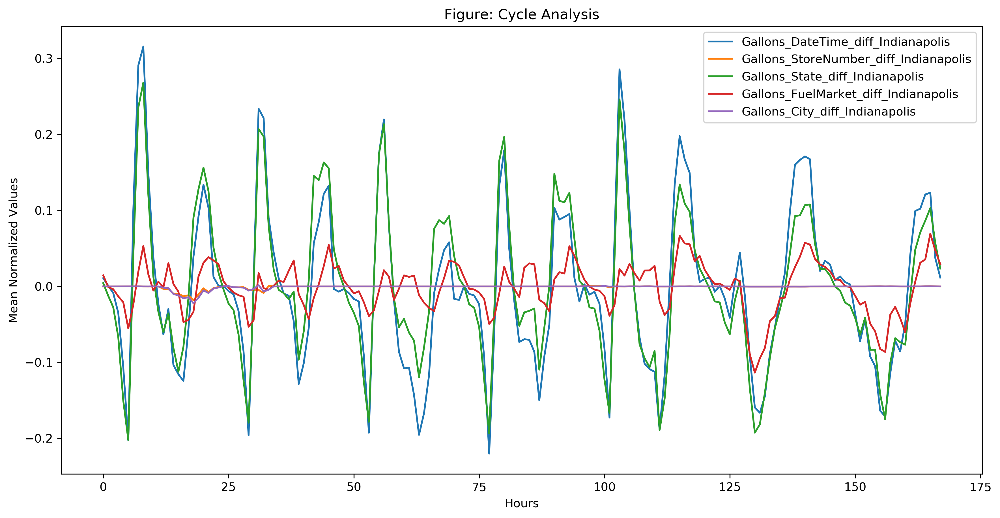

In [83]:
plot_data_mean(Speedway_Full_df,['Gallons_DateTime_diff',
       'Gallons_StoreNumber_diff',
       'Gallons_State_diff',
       'Gallons_FuelMarket_diff',
       'Gallons_City_diff',  ],city='Indianapolis')

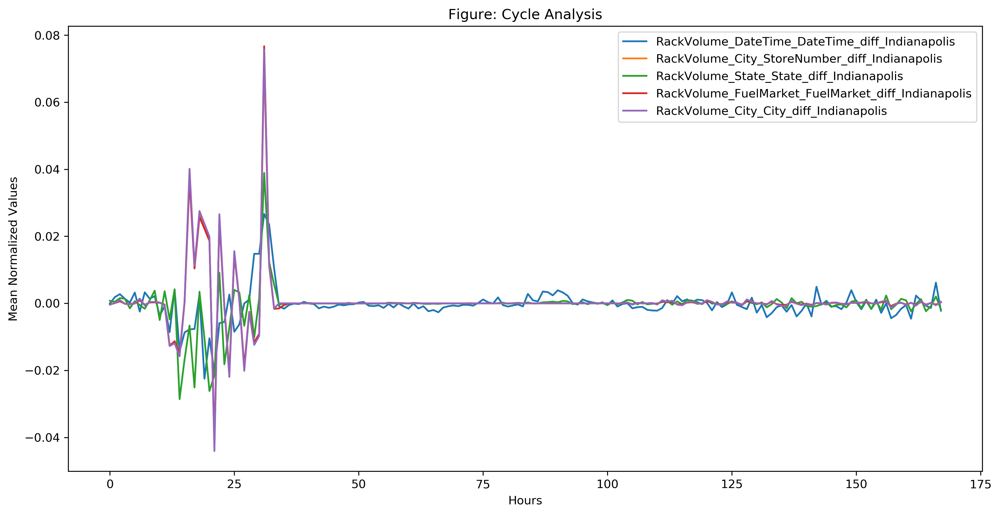

In [85]:
plot_data_mean(Speedway_Full_df,[
       'RackVolume_DateTime_DateTime_diff',
       'RackVolume_City_StoreNumber_diff', 
       'RackVolume_State_State_diff',
       'RackVolume_FuelMarket_FuelMarket_diff', 
       'RackVolume_City_City_diff'  ],city='Indianapolis')

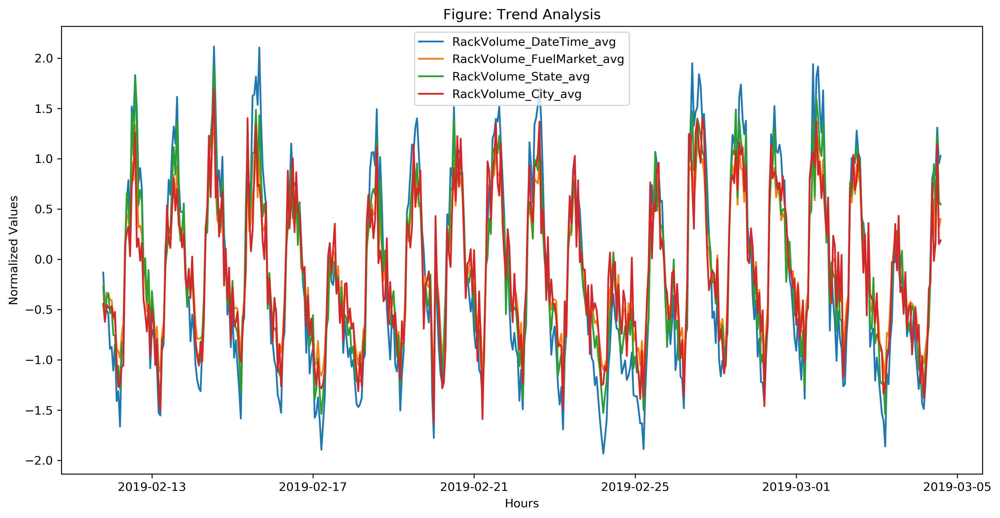

In [68]:
plot_data(Speedway_Full_df,['RackVolume_DateTime','RackVolume_FuelMarket', 
       'RackVolume_State', 'RackVolume_City',
       ],trunc=[1000,1500])

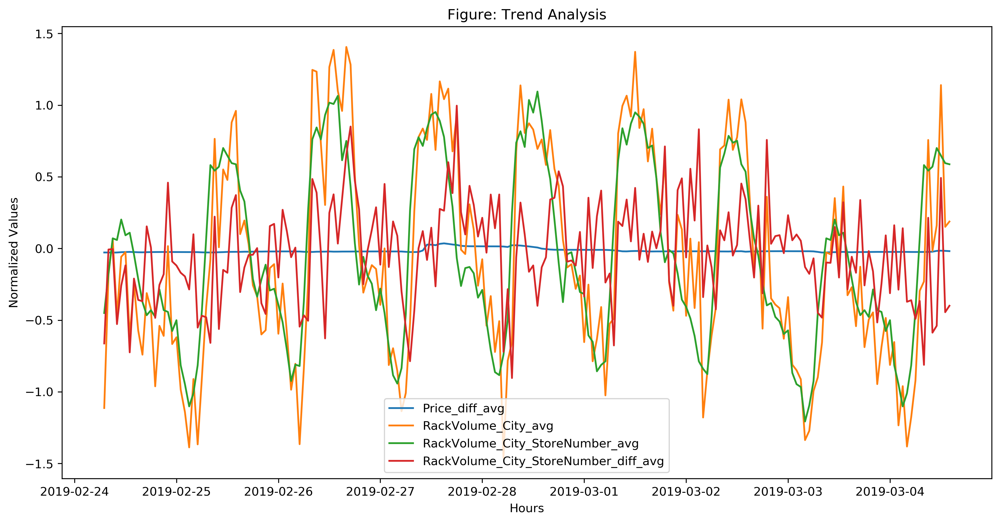

In [69]:
plot_data(Speedway_Full_df,['Price_diff','RackVolume_City','RackVolume_City_StoreNumber','RackVolume_City_StoreNumber_diff'],trunc=[1300,1500])

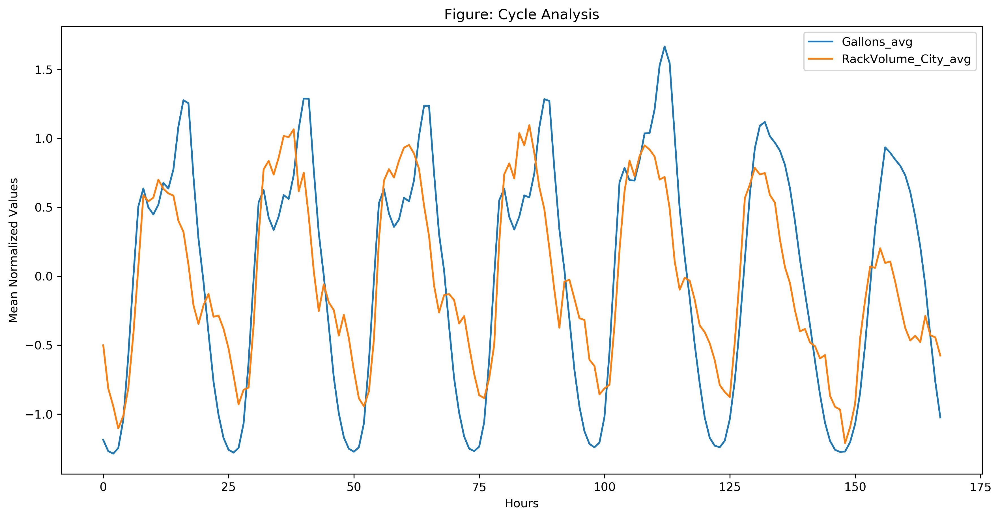

In [71]:
plot_data_mean(Speedway_Full_df,['Gallons','RackVolume_City'])

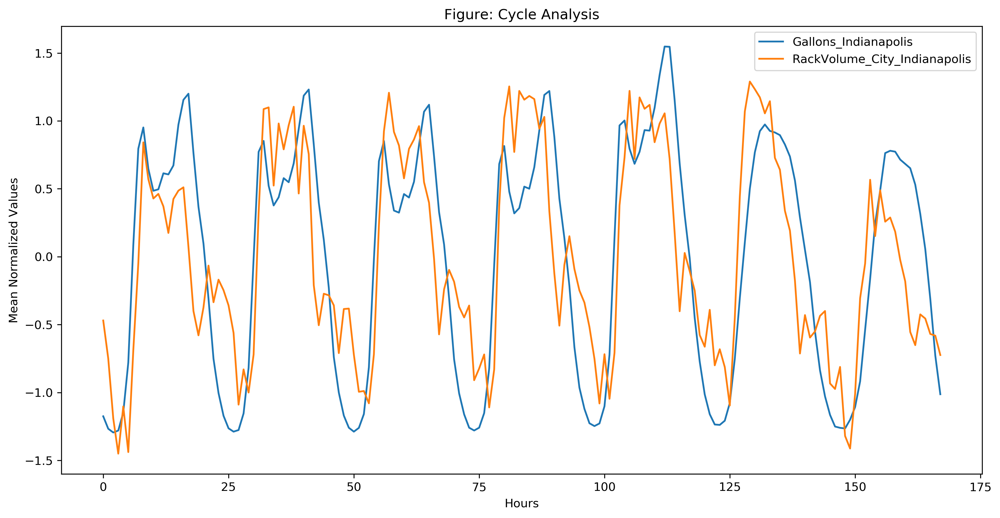

In [72]:
plot_data_mean(Speedway_Full_df,['Gallons','RackVolume_City'],city='Indianapolis')

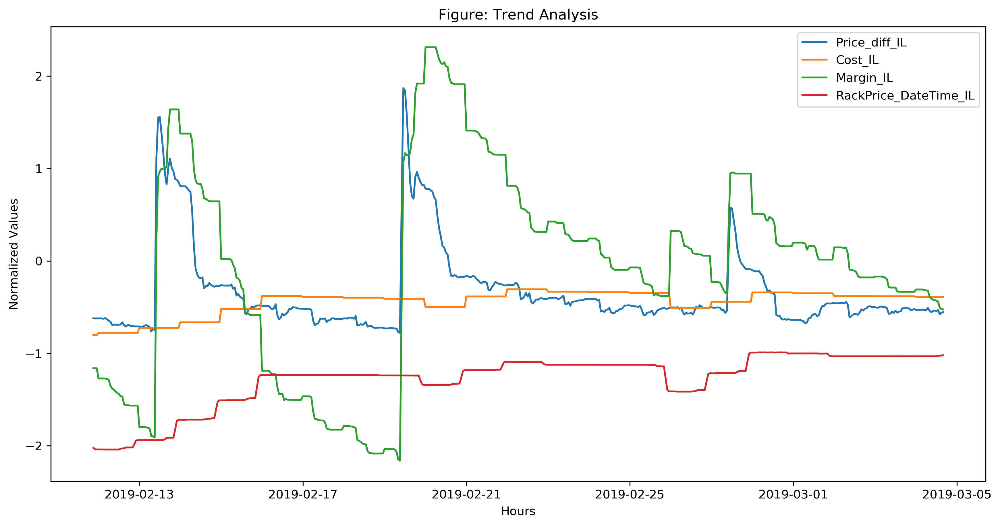

In [86]:
plot_data(Speedway_Full_df,['Price_diff','Cost','Margin','RackPrice_DateTime'],state='IL',trunc=[1000,1500], normalize=True)

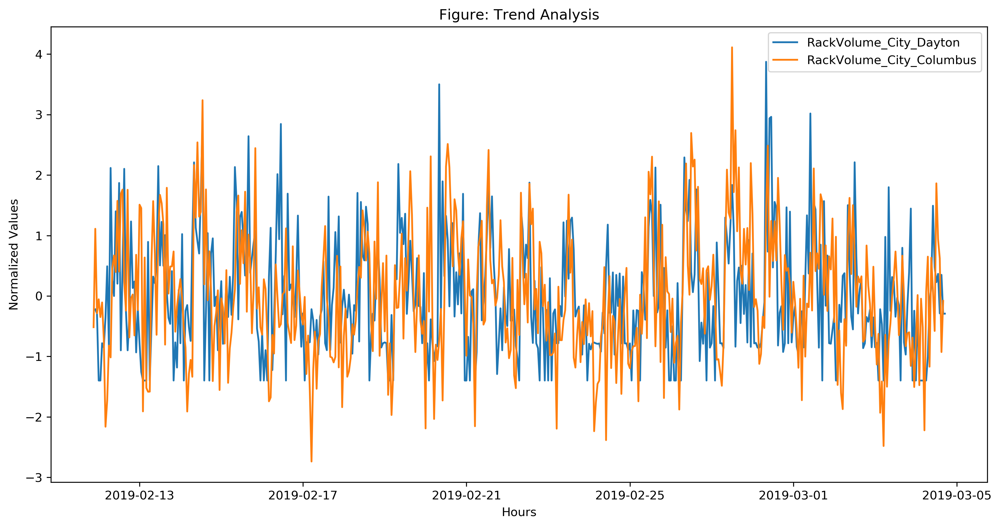

In [74]:
plot_data(Speedway_Full_df,['RackVolume_City'],state='OH',city=['Dayton','Columbus'],trunc=[1000,1500])

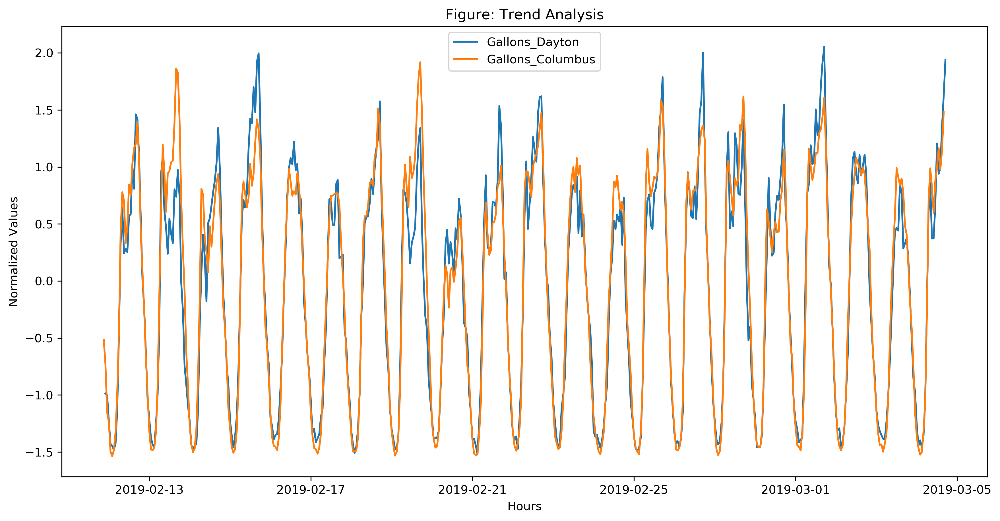

In [75]:
plot_data(Speedway_Full_df,['Gallons'],state='OH',city=['Dayton','Columbus'],trunc=[1000,1500])

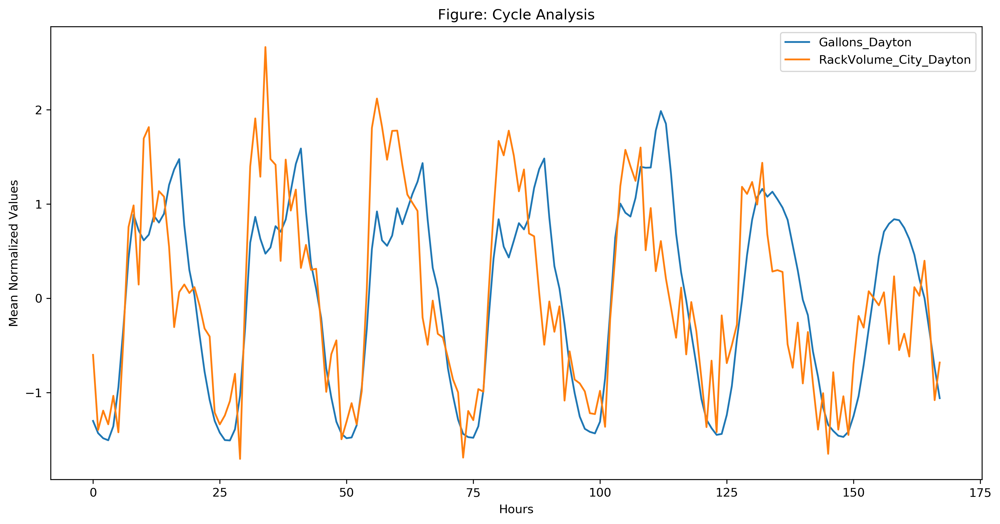

In [79]:
plot_data_mean(Speedway_Full_df,['Gallons','RackVolume_City'],city=['Dayton'])

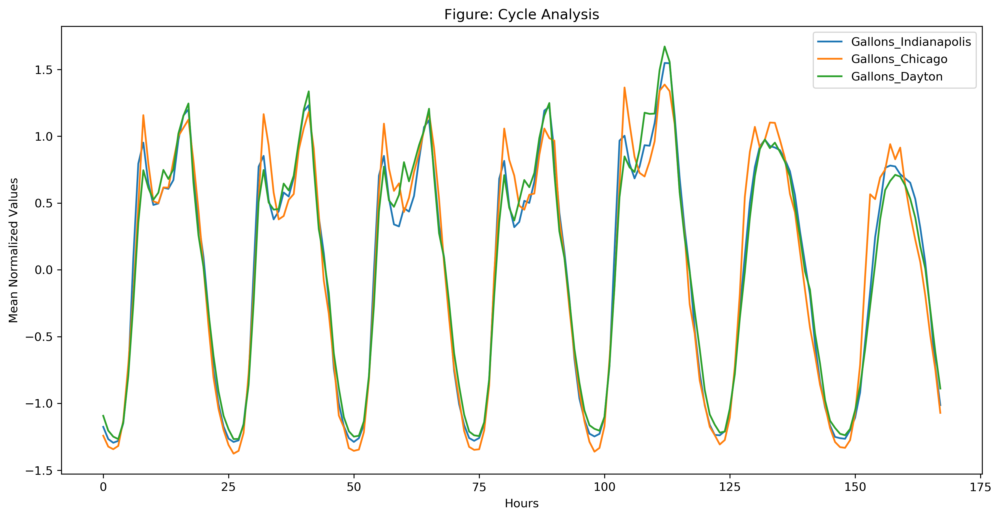

In [87]:
plot_data_mean(Speedway_Full_df,['Gallons'],city=['Indianapolis','Chicago','Dayton'])

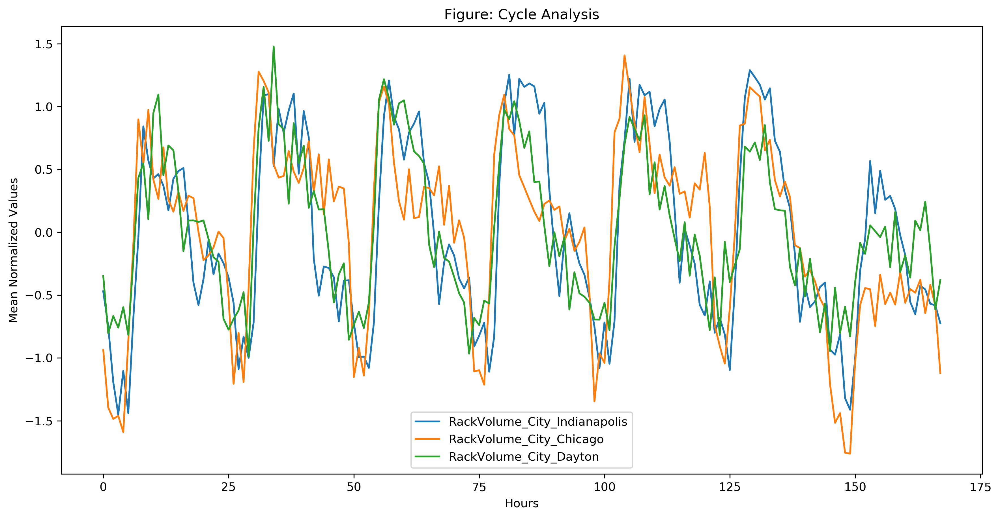

In [88]:
plot_data_mean(Speedway_Full_df,['RackVolume_City'],city=['Indianapolis','Chicago','Dayton'])

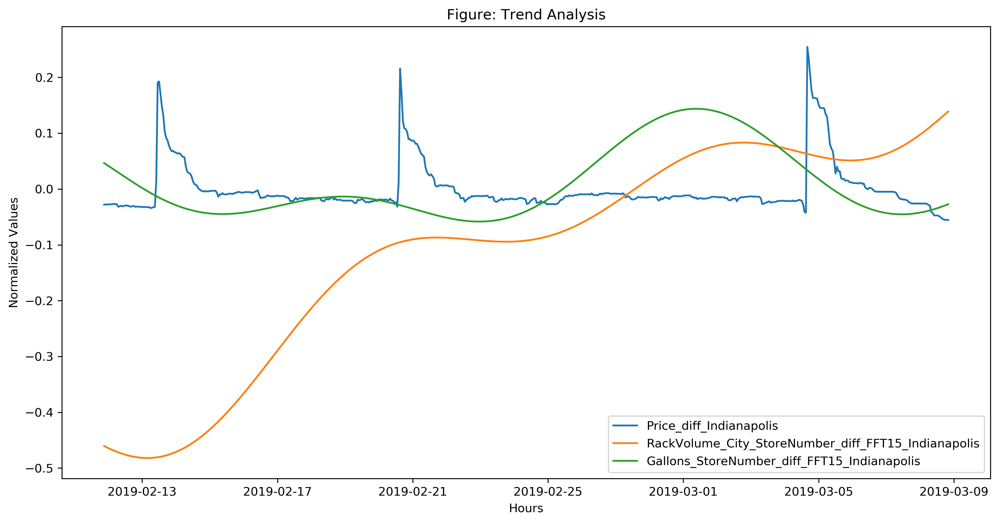

In [ ]:
'RackVolume_DateTime_DateTime_diff',
       'RackVolume_City_StoreNumber_diff', 
       'RackVolume_State_State_diff',
       'RackVolume_FuelMarket_FuelMarket_diff', 
       'RackVolume_City_City_diff'

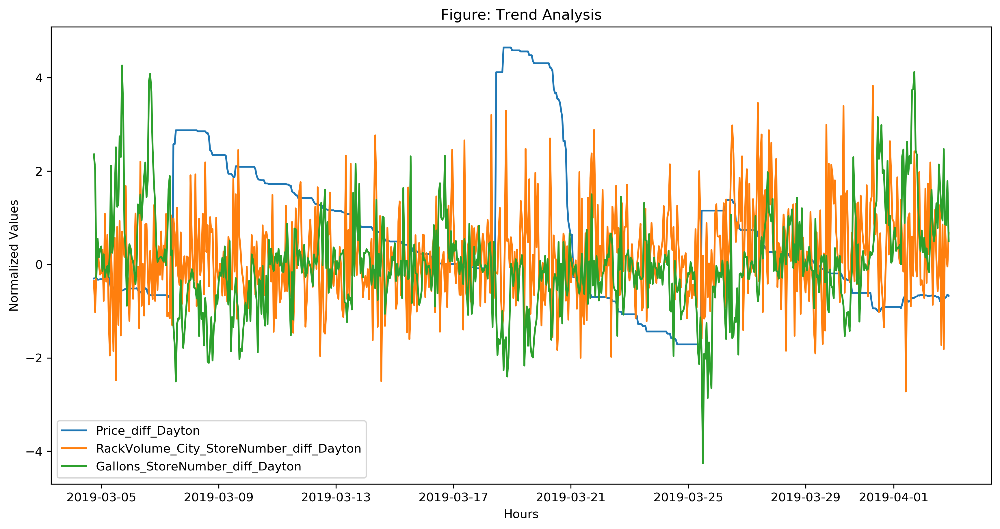

In [114]:
plot_data(Speedway_Full_df,['Price_diff','RackVolume_City_StoreNumber_diff','Gallons_StoreNumber_diff'],city=['Dayton'],trunc=[1500,2200], normalize=True)

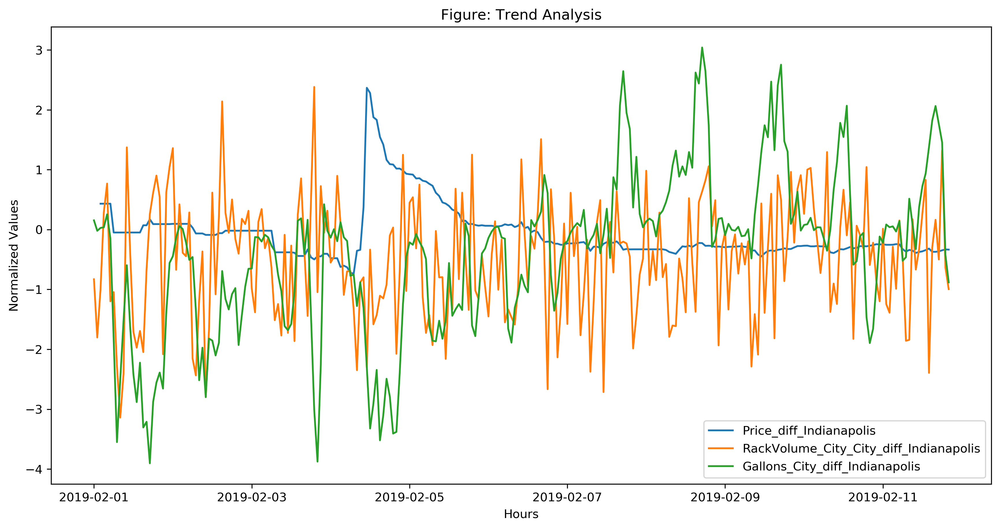

In [106]:
plot_data(Speedway_Full_df,['Price_diff','RackVolume_City_City_diff','Gallons_City_diff'],city=['Indianapolis'],trunc=[500,1000], normalize=True)

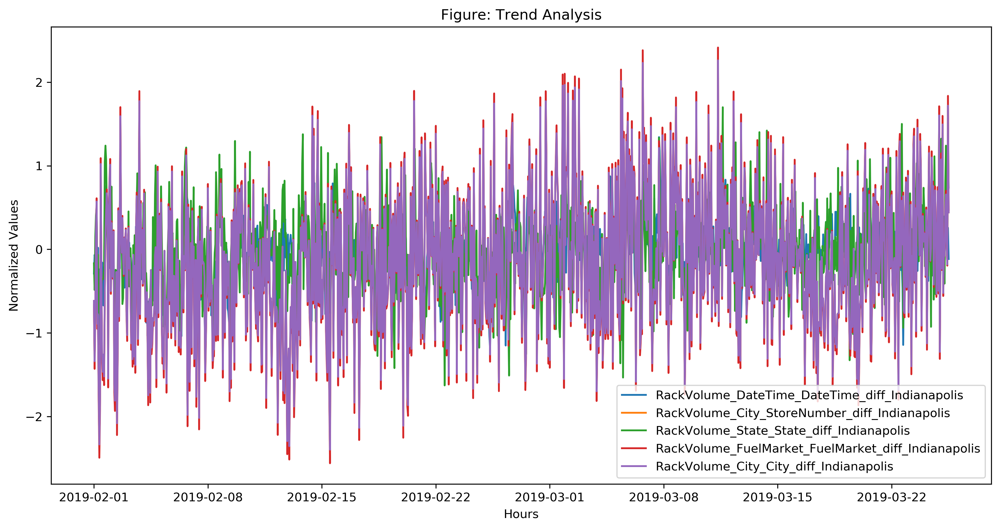

In [105]:
plot_data(Speedway_Full_df,['RackVolume_DateTime_DateTime_diff',
       'RackVolume_City_StoreNumber_diff', 
       'RackVolume_State_State_diff',
       'RackVolume_FuelMarket_FuelMarket_diff', 
       'RackVolume_City_City_diff'],city=['Indianapolis'],trunc=[500,2000], normalize=False)

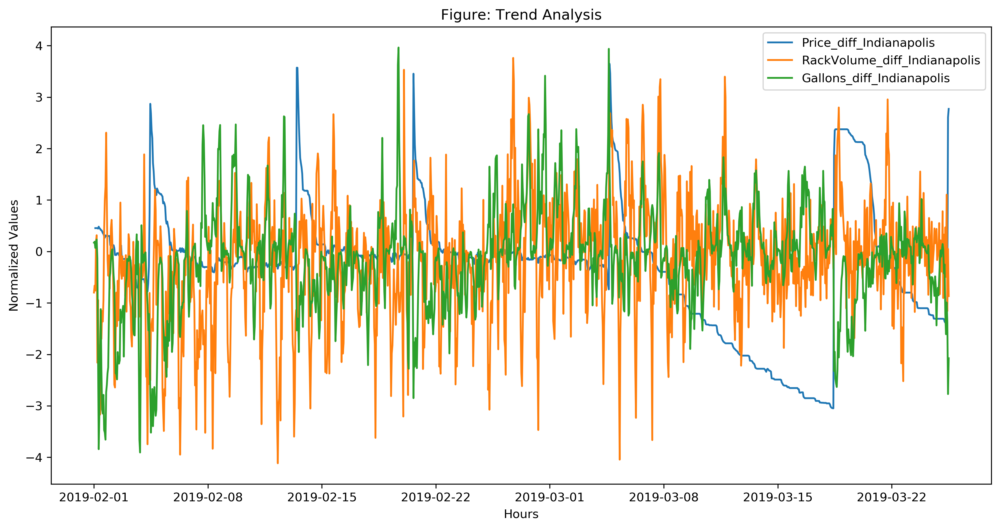

In [32]:
plot_data(Speedway_Full_df_mean,['Price_diff','RackVolume_diff','Gallons_diff'],city=['Indianapolis'],trunc=[500,2000])

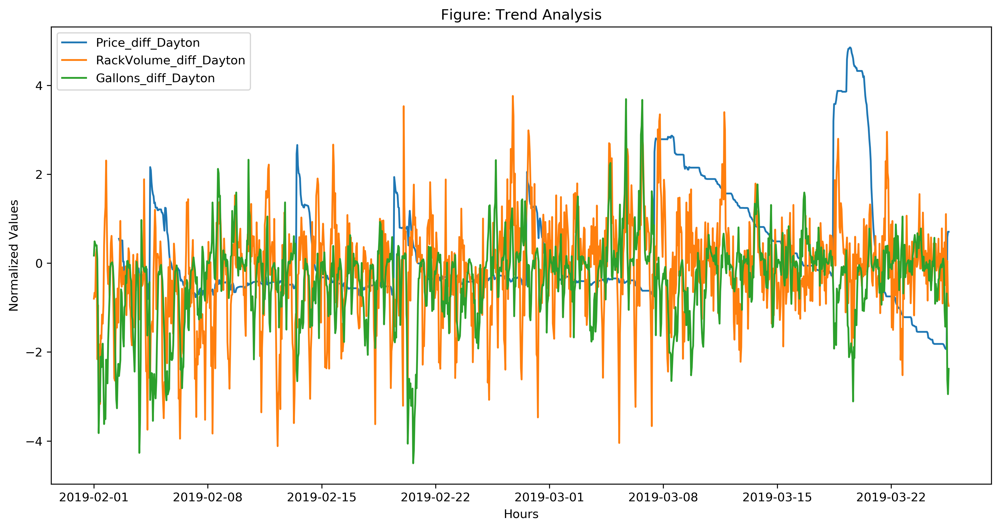

In [31]:
plot_data(Speedway_Full_df_mean,['Price_diff','RackVolume_diff','Gallons_diff'],city=['Dayton'],trunc=[500,2000])

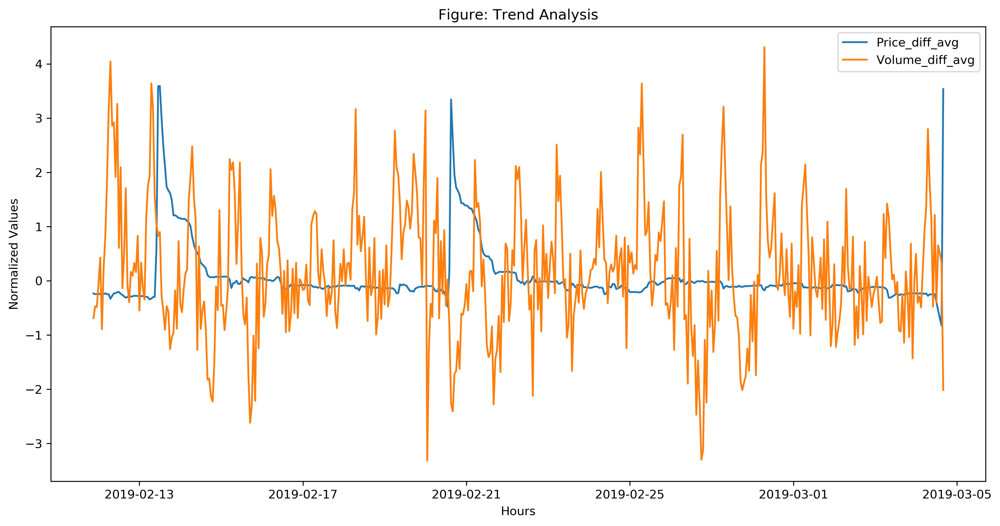

In [32]:
df=Speedway_Full_df_mean[Speedway_Full_df_mean['City']=='Indianapolis'][['Price_diff','RackVolume_diff','Gallons_diff_store']]#'RackVolume_diff_FFT15','Gallons_diff_FFT15']]
df['Volume_diff']=df['Gallons_diff_store']-df['RackVolume_diff']
df=df[['Price_diff','Volume_diff']]

df['DateTime']=Speedway_Full_df_mean['DateTime']
plot_data(df,['Price_diff','Volume_diff'],trunc=[1000,1500])

c:\users\md38\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
c:\users\md38\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


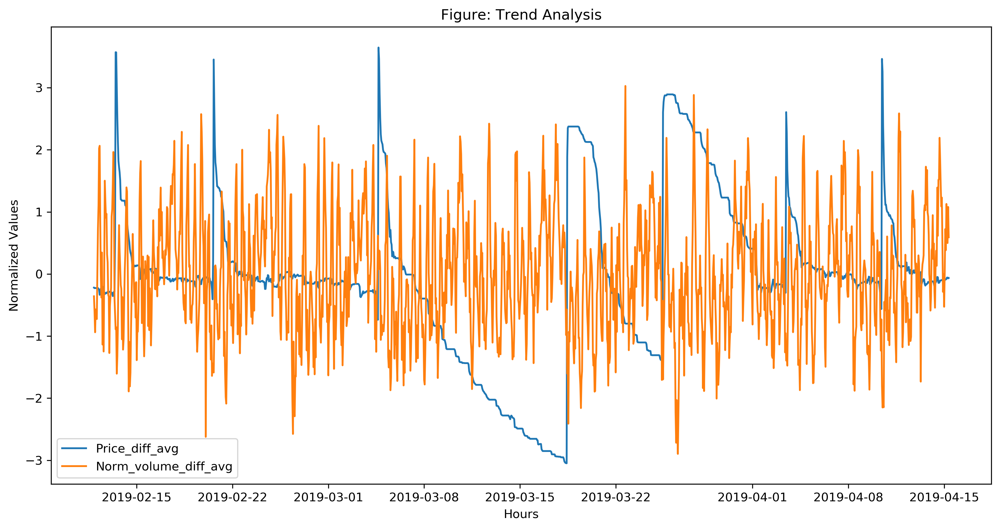

In [39]:
df=Speedway_Full_df_mean[Speedway_Full_df_mean['City']=='Indianapolis'][['Price_diff','RackVolume','Gallons']]#'RackVolume_diff_FFT15','Gallons_diff_FFT15']]

df['Norm_volume_diff']=df['Gallons']-df['RackVolume']
df['DateTime']=Speedway_Full_df_mean['DateTime']
plot_data(df,['Price_diff','Norm_volume_diff'],trunc=[1000,2500])

In [35]:
#(Speedway_Full_df_mean['Gallons_FFT90']-Speedway_Full_df_mean['Gallons_avg_FFT90'])[:300].plot()
#Speedway_Full_df_mean['Gallons_diff_FFT902']=(Speedway_Full_df_mean['Gallons_FFT90']-Speedway_Full_df_mean['Gallons_avg_FFT90'])